# Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 

# Load Data

In [2]:
spray_data = pd.read_csv('../input/spray.csv') # loading in the spray data - data is from kaggle
df_test = pd.read_csv('../input/test.csv') # loading in the test data - data is from kaggle
df_train = pd.read_csv('../input/train.csv') # loading in the train data - data is from kaggle
df_weather = pd.read_csv('../input/weather.csv') # loading in the weather data - data is from kaggle

# Map with Traps and Weather Stations

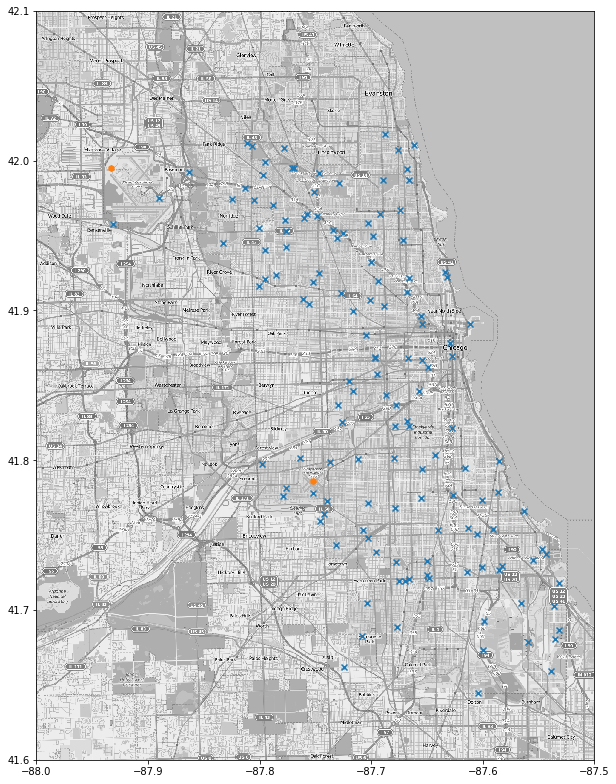

In [3]:
mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')
plt.scatter(long, lat, marker='h')

#### Weather stations in realation to traps
1. blue x are traps
2. orange dots are weather stations

In [4]:
from haversine import haversine

#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level

station1 = (-87.933, 41.995) # Given locations for station 1 and 2
station2 = (-87.752, 41.786)
station_dummy = [] # empty list to append stations
for each in locations:
    a = haversine(tuple(reversed(each)), reversed(station1))
    b = haversine(tuple(reversed(each)), reversed(station2))
    if a > b:
        station_dummy.append(1)
    else:
        station_dummy.append(2)

In [5]:
locations_df = pd.DataFrame(locations, columns=['Longitude', 'Latitude'])
locations_df['Station'] = station_dummy
locations_df.head();

In [6]:
train_df = pd.merge(df_train, locations_df, how='left')  # joining the dummy dataframe to the train to add a station number
test_df = pd.merge(df_test, locations_df, how='left') # joining the dummy dataframe to the test to add a station number

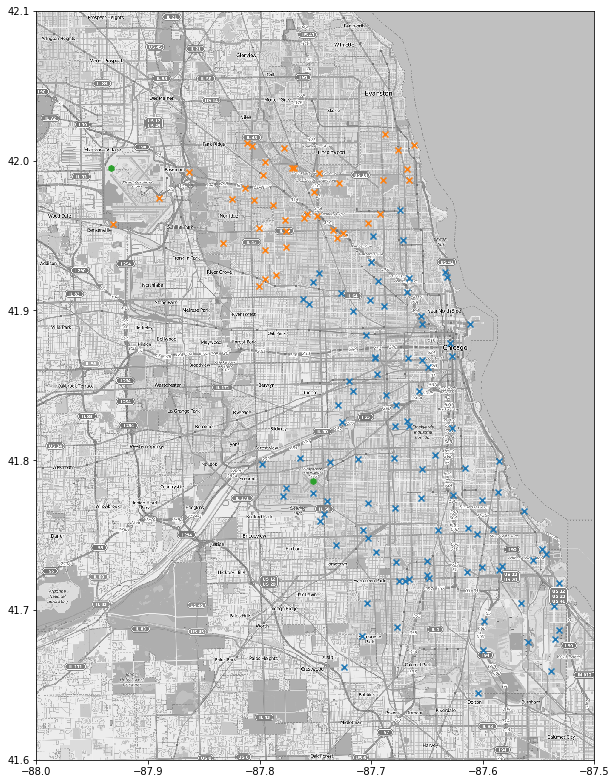

In [7]:
mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values
location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(location1[:,0], location1[:,1], marker='x')
plt.scatter(location2[:,0], location2[:,1], marker='x')
plt.scatter(long, lat, marker='h')

In [8]:
train = pd.merge(train_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                 how='left') # merging the weather data to the train data based on the trap location
test = pd.merge(test_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                how='left') # merging the weather data to the test data based on the trap location

As a group, we have borrowed a graph from Kaggle to see the overall trap locations. Based on this graph, we have decided to calculate and split which traps are near either station 1 or station 2 by using longitude and latitude. After successfully separating trap location to station 1 and station 2,  trap location data was merged into the training dataset to add station numbers.

In addition, we decided to use Station, Date, Temperature max, Temperature Average, Dew Point, Precipitation Total, and Sea Level as features for Weather data. After deciding which features to use for the Weather dataset, Weather data was merged with train and test datasets.

# Simple Data Cleaning / EDA 

In [9]:
#Change date to datetime.
train['Date'] = pd.to_datetime(train.Date)

#Add columns month, and day by seperating it from date.
train['Month'] = train['Date'].dt.month
train['Day'] = train['Date'].dt.day

# Do same for test data
test['Date'] = pd.to_datetime(test.Date)

#Add columns year, month, and day by seperating it from date.
test['Month'] = test['Date'].dt.month
test['Day'] = test['Date'].dt.day

In [10]:
# Replace T to 0.01, M to 0, and convert preciptotal column to float
train['PrecipTotal'] = train['PrecipTotal'].str.replace('T', '0.01')
train['PrecipTotal'] = train['PrecipTotal'].str.replace('M', '0')
train['PrecipTotal'] = train['PrecipTotal'].astype(float)
train['SeaLevel'] = train['SeaLevel'].astype(float)
train['Tavg'] = train['Tavg'].astype(float)
train['PrecipTotal'] = train['PrecipTotal'].astype(float)

# Do the same for the test data, replace nan to appropriate mean value for its columntest['PrecipTotal'] = test['PrecipTotal'].str.replace('T', '0.01')
test['PrecipTotal'] = test['PrecipTotal'].str.replace('M', '0')
test['PrecipTotal'] = test['PrecipTotal'].replace(np.NaN, 0.14)

test['SeaLevel'] = test['SeaLevel'].replace(np.NaN, 30)
test['SeaLevel'] = test['SeaLevel'].astype(float)

test['Tmax'] = test['Tmax'].replace(np.NaN, 81.17)
test['Tavg'] = test['Tavg'].replace(np.NaN, 0)
test['Tavg'] = test['Tavg'].astype(float)

test['Station'] = test['Station'].replace(np.NaN, 0)

test['DewPoint'] = test['DewPoint'].replace(np.NaN, 57.42)

In [11]:
# Drop columns Address, AddressNumberAndStreet, and AddressAccuracy
train = train.drop(['Address', 'AddressNumberAndStreet', 'Station',
                    'AddressAccuracy', 'Date'], axis = 1)
# Do same for test data
test = test.drop(['Address', 'AddressNumberAndStreet', 'Station',
                  'AddressAccuracy', 'Date', 'Station', 'Id'], axis = 1)

After observing the train data, dataset needed few basic clean ups before moving into Exploratory data analysis. First, the Date column needs to be converted into numerical values by splitting it into month and day. In addition, PrecipTotal column contained string values "M" for missing data and "T" for trace (small measurement). These string values were converted into 0 for "M" and 0.01 for "T". On the other hand, for test data, all missing values were converted by getting the appropriate average number for its columns. 

After cleaning the dataset, the group decided to drop Address, Address Number and Street, Station,  Address Accuracy,  Date for train dataset and Address, Address Number and Street, Station, Address Accuracy, Date, Station, Id for test dataset.

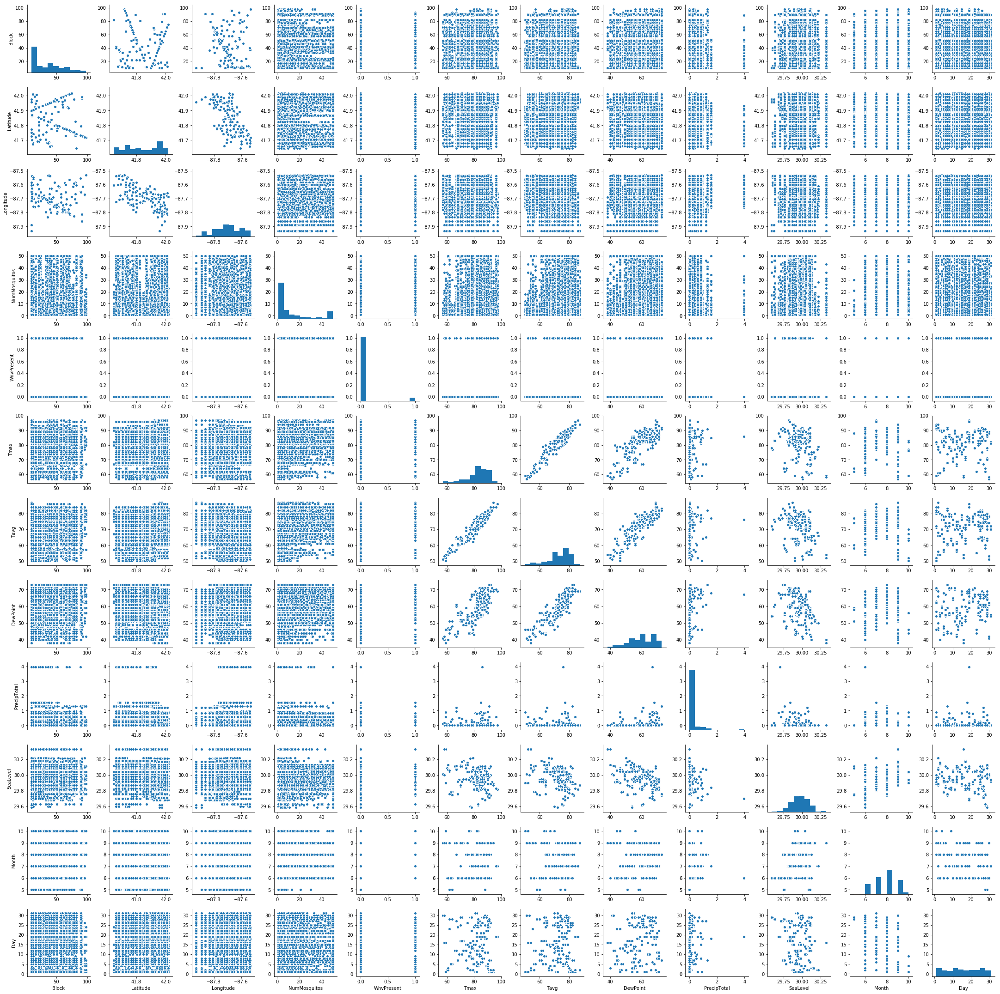

In [12]:
# Plot a pairplot to see visually 
sns.pairplot(train)
plt.show()

This pair plot gives overall insight on how data are distributed and the relationship between each feature.

The distributions of columns for Blocks, NumMosquitos, and PrecipTotal show positively skewed. This indicates that there are few high counts. On the other hand, distribution of columns for Tmax, Tavg, and DewPoint show negatively skewed. This indicates that there are few low counts. Moreover, the distribution of columns for Day, Month, Sea Level, Longitude,  and Latitude show normal distribution. This indicates that data are well distributed. Lastly, there are more 0 than 1 in the WnvPresent graph. This indicates that our baseline is going to be high.

Overall, columns Tmax, Tavg, and Dewpoint have the positive correlation with each other.

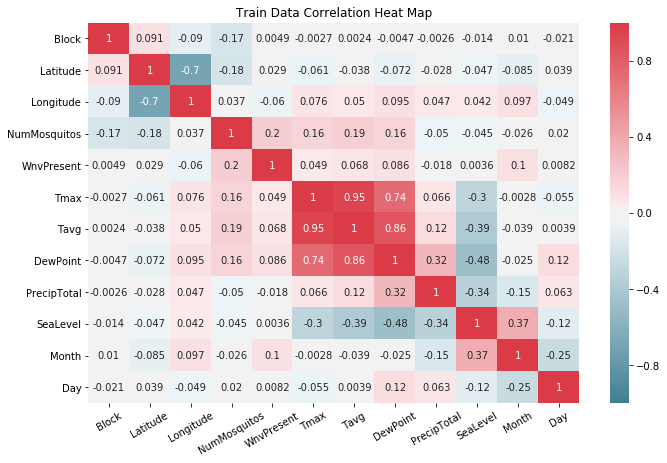

In [13]:
# Plot a heatmap on train data to see correlations in numbers.
def correlation_heat_map(df):
    corrs = train.corr()

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(11,7))

    # Generate a mask for the upper triangle (taken from the Seaborn example gallery):
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Plot the heatmap with Seaborn.
    # Assign the matplotlib axis the function returns. This allow us to resize the labels.
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    ax = sns.heatmap(corrs, annot=True, cmap=cmap, vmin=-1, vmax=1)

    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=10, rotation=30)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=10, rotation=0)

    # If you put plt.show() at the bottom, it prevents those useless printouts from matplotlib.
    plt.title('Train Data Correlation Heat Map')
    
correlation_heat_map(train)

Instead only visualizing, seeing the actual correlation in numbers makes better sense. This heat map allows for us to see the relationship in between each feature numerically.

Color red shows the positive relationship and blue shows the negative relationship. The columns NumMosquitos, Tmax, Tavg, DewPoint, SeaLevel, Month, and Day shows the positive relationship to WnvPresent.

                  Species  WnvPresent
2  CULEX PIPIENS/RESTUANS         262
1           CULEX PIPIENS         240
3          CULEX RESTUANS          49
0         CULEX ERRATICUS           0
4        CULEX SALINARIUS           0
5          CULEX TARSALIS           0
6         CULEX TERRITANS           0


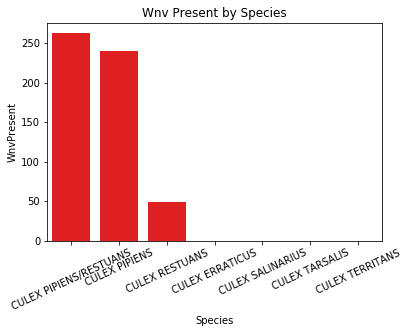

In [14]:
top_wnv_species = train.groupby("Species", as_index=False)["WnvPresent"].sum().sort_values("WnvPresent", ascending=False).head(7)
print(top_wnv_species)

sns.barplot(x=top_wnv_species["Species"],
            y=top_wnv_species['WnvPresent'], color='r').set(title='Wnv Present by Species')
plt.xticks(rotation=25)
plt.show();

Top three species that carries West Nile Virus are CULEX PIPIENS/RESTUANS, CULEX PIPIENS, CULEX RESTUANS.

   Month  NumMosquitos
3      8         58036
2      7         37248
4      9         21029
1      6         16578
5     10          1918
0      5           230


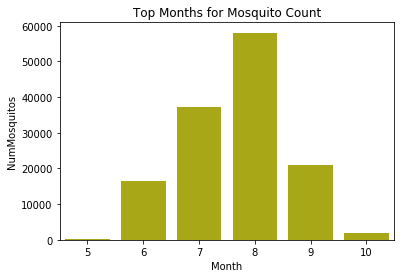

In [15]:
top_mosq_months = train.groupby("Month", as_index=False)["NumMosquitos"].sum().sort_values("NumMosquitos", ascending=False).head(10)
print(top_mosq_months.head(10))

sns.barplot(x=top_mosq_months["Month"],
            y=top_mosq_months["NumMosquitos"], color='y').set(title='Top Months for Mosquito Count')
plt.show();

This bar graph shows that mosquito population drastically increases from July to August and also drops significantly in September. 

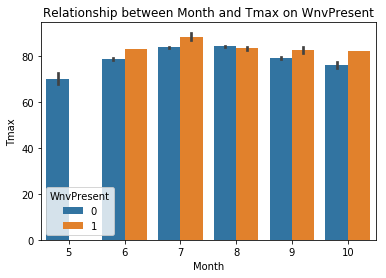

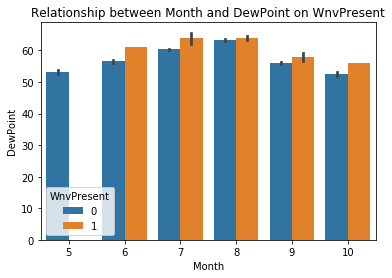

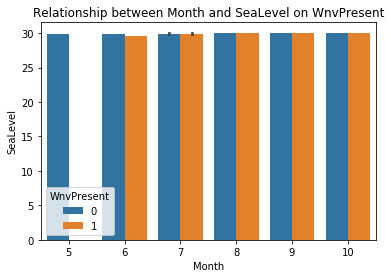

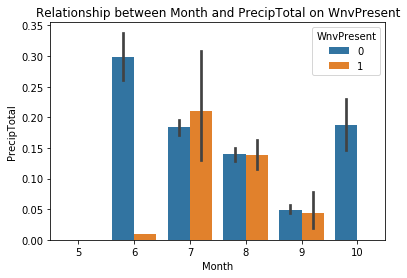

In [16]:
plot_columns = ['Tmax', 'DewPoint', 'SeaLevel', 'PrecipTotal']

for i in plot_columns:
    sns.barplot(x=train['Month'],
            y=train[i],
            hue=train['WnvPresent']).set(title=f'Relationship between Month and {i} on WnvPresent')
    plt.show();
    print

West Nile virus seems to thrive at high temperature and high moisture level.

### Map of the Traps
Lets try to visualize where we collected our data points in relation to the city

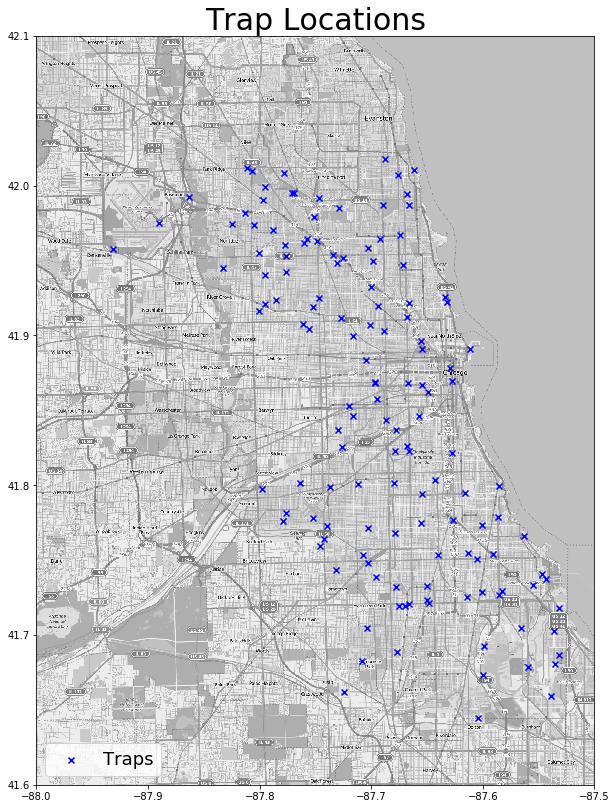

In [17]:
mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', c='b')
plt.title('Trap Locations', fontsize=30)
plt.legend(['Traps'], fontsize=18,loc=3)

plt.savefig('heatmap.png')

In [18]:
spray_data = pd.read_csv('../input/spray.csv') # loading in the spray data - data is from kaggle
spray_data.columns; # checking to see the columns in spray data

df_test = pd.read_csv('../input/test.csv') # loading in the test data - data is from kaggle
df_test.columns; # checking to see the columns in test data

df_train = pd.read_csv('../input/train.csv') # loading in the train data - data is from kaggle
df_train.columns; # checking to see the columns in test data

df_weather = pd.read_csv('../input/weather.csv') # loading in the weather data - data is from kaggle

df_weather.columns; # checking to see the columns in weather data

### Map with Traps and Weather Stations

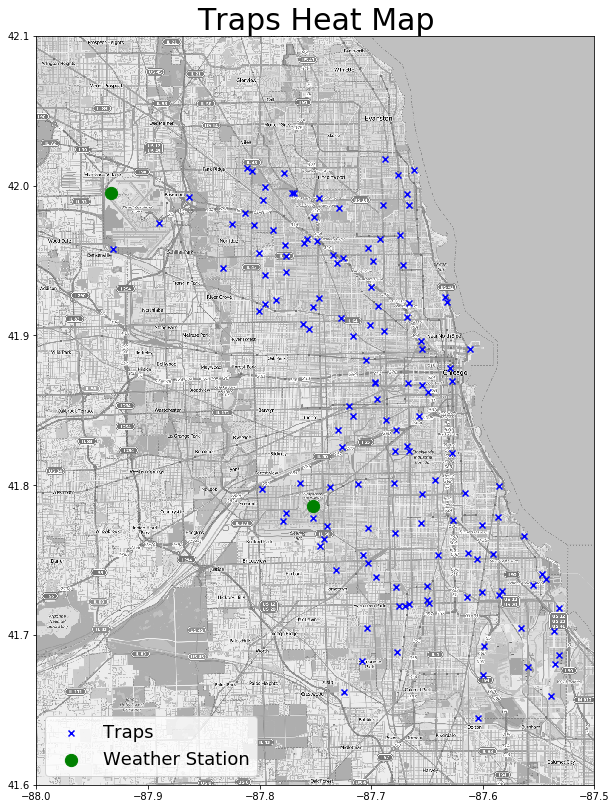

In [19]:
mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x', c='b')
plt.scatter(long, lat, marker='o', c='g',s=150)
plt.title('Traps Heat Map', fontsize=30)

plt.legend(['Traps', 'Weather Station'], fontsize=18,loc=3)

plt.savefig('heatmap1.png')

##### Station determinations for the train data

As each observed day has two different weather recordings (one from each airport), our goal is to hopefully associate the closest weather station to each trap respectfully.

In [20]:
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level

# grouping the train dataset trap locations to the propper weather station by distance
station1 = (-87.933, 41.995)
station2 = (-87.752, 41.786)
station_dummy = []
for each in locations:
    a = haversine(tuple(reversed(each)), reversed(station1))
    b = haversine(tuple(reversed(each)), reversed(station2))
    if a > b:
        station_dummy.append(1)
    else:
        station_dummy.append(2)

# creating a dataframe for the new station values
locations_df = pd.DataFrame(locations, columns=['Longitude', 'Latitude'])
locations_df['Station'] = station_dummy

# joining the dummy dataframe to the train to add a station number
train_df = pd.merge(df_train, locations_df, how='left')  


##### Station determinations for the test data

In [21]:
# getting station designations for test data.

# grouping the test dataset trap locations to the propper weather station by distance
locations_test = df_test[['Longitude', 'Latitude']].drop_duplicates().values
station1 = (-87.933, 41.995)
station2 = (-87.752, 41.786)
station_dummy_test = []
for each in locations_test:
    a = haversine(tuple(reversed(each)), reversed(station1))
    b = haversine(tuple(reversed(each)), reversed(station2))
    if a > b:
        station_dummy_test.append(1)
    else:
        station_dummy_test.append(2)

locations_df_test = pd.DataFrame(locations_test, columns=['Longitude', 'Latitude'])
locations_df_test['Station'] = station_dummy_test

# joining the dummy dataframe to the test to add a station number
test_df = pd.merge(df_test, locations_df_test, how='left') 



### Creating a map for trap clustering via weather station

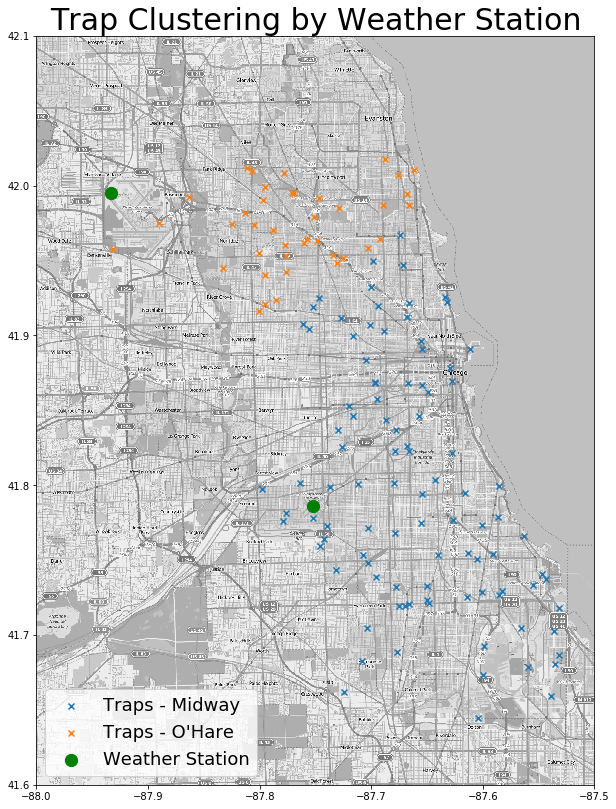

In [22]:
mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values
location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(location1[:,0], location1[:,1], marker='x')
plt.scatter(location2[:,0], location2[:,1], marker='x')
plt.scatter(long, lat, marker='o',c='g', s=150)
plt.title('Trap Clustering by Weather Station', fontsize=30)

plt.legend(['Traps - Midway', "Traps - O'Hare", 'Weather Station'], fontsize=18,loc=3)

plt.savefig('heatmap2.png')

### Creating a spray data heatmap

Once we are able to see the stations. Lets visualize where the city historically sprayed insecticide.

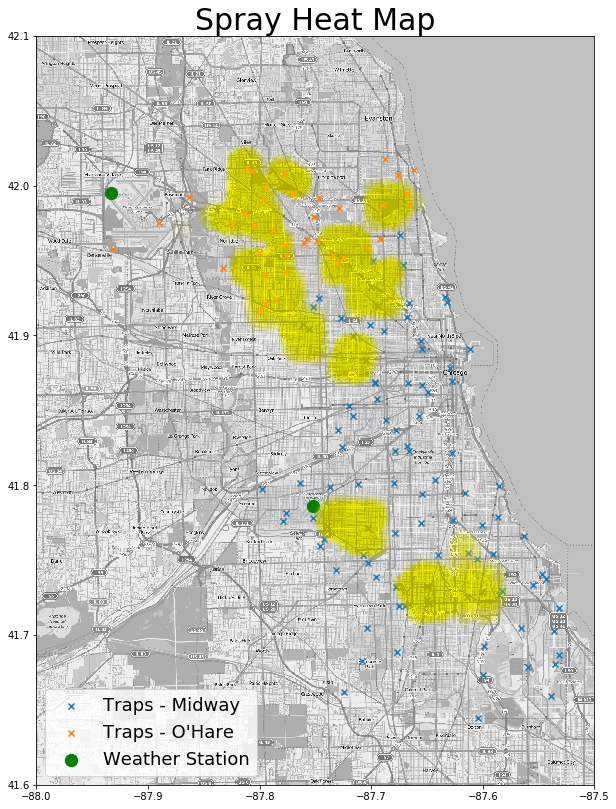

In [23]:

mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
spray_locations = spray_data[['Longitude', 'Latitude']][spray_data.Longitude > -88].drop_duplicates().values

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values
location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(location1[:,0], location1[:,1], marker='x')
plt.scatter(location2[:,0], location2[:,1], marker='x')
plt.scatter(long, lat, marker='o',c='g', s=150)
plt.scatter(spray_locations[:,0], spray_locations[:,1], marker='h', c='yellow', alpha=0.01, s=600)
plt.title('Spray Heat Map', fontsize=30)
plt.legend(['Traps - Midway', "Traps - O'Hare", 'Weather Station'], fontsize=18,loc=3)


plt.savefig('heatmap3.png')

### West Nile Positives relative to Spray Data - All Years

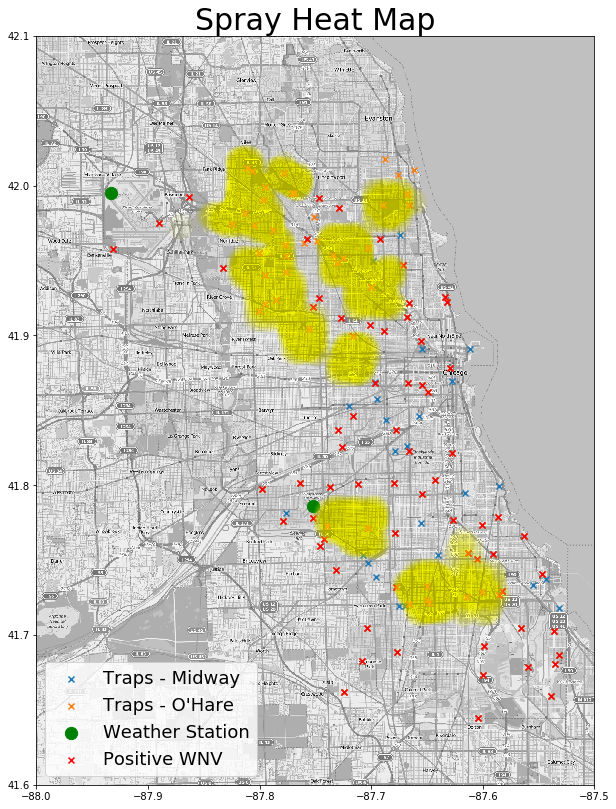

In [24]:

mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
spray_locations = spray_data[['Longitude', 'Latitude']][spray_data.Longitude > -88].drop_duplicates().values
positives = traps[traps.WnvPresent==1][['Longitude', 'Latitude']].drop_duplicates().values

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values
location1s = pd.concat([pd.DataFrame(location1), pd.DataFrame(positives)], axis=0).drop_duplicates().values
location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values
location2s = pd.concat([pd.DataFrame(location2), pd.DataFrame(positives)], axis=0).drop_duplicates().values
plt.scatter(location1s[:,0], location1s[:,1], marker='x')
plt.scatter(location2s[:,0], location2s[:,1], marker='x')
plt.scatter(long, lat, marker='o',c='g', s=150)
plt.scatter(positives[:,0], positives[:,1], marker='x', c='red')
plt.scatter(spray_locations[:,0], spray_locations[:,1], marker='o', c='yellow', alpha=0.01, s=600)

plt.title('Spray Heat Map', fontsize=30)

plt.legend(['Traps - Midway', "Traps - O'Hare", 'Weather Station', 'Positive WNV'], fontsize=18,loc=3)



plt.savefig('heatmap4.png')

### West Nile Positives relative to Spray Data - 2011

/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


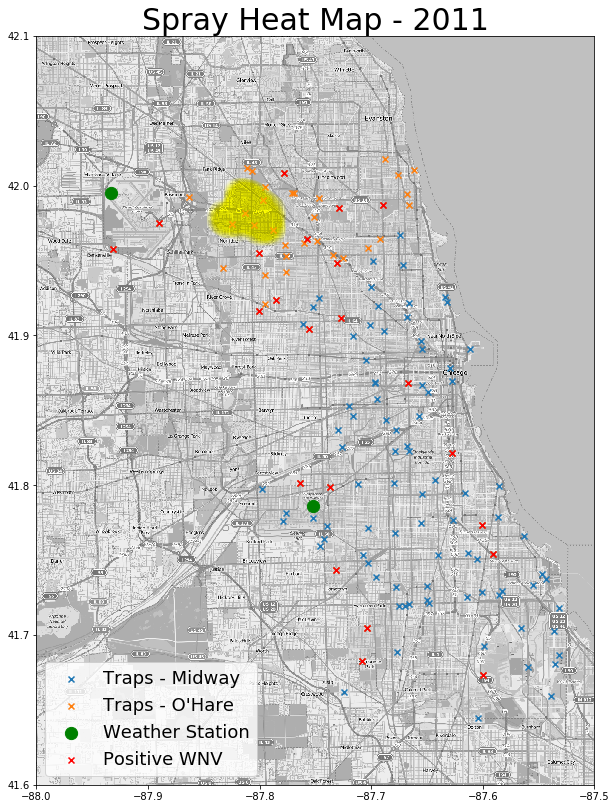

In [25]:

mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
spray_locations = spray_data[['Longitude', 'Latitude']][spray_data.Longitude > -88][spray_data.Date.str.contains("2011")].drop_duplicates().values
positives = traps[traps.WnvPresent==1][['Longitude', 'Latitude']][traps.Date.str.contains("2011")].drop_duplicates().values

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values
location1s = pd.concat([pd.DataFrame(location1), pd.DataFrame(positives)], axis=0).drop_duplicates().values
location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values
location2s = pd.concat([pd.DataFrame(location2), pd.DataFrame(positives)], axis=0).drop_duplicates().values
plt.scatter(location1s[:,0], location1s[:,1], marker='x')
plt.scatter(location2s[:,0], location2s[:,1], marker='x')
plt.scatter(long, lat, marker='o',c='g', s=150)
plt.scatter(positives[:,0], positives[:,1], marker='x', c='red')
plt.scatter(spray_locations[:,0], spray_locations[:,1], marker='o', c='yellow', alpha=0.01, s=600)

plt.title('Spray Heat Map - 2011', fontsize=30)


plt.legend(['Traps - Midway', "Traps - O'Hare", 'Weather Station', 'Positive WNV'], fontsize=18,loc=3)

plt.savefig('heatmap5.png')

### West Nile Positives relative to Spray Data - 2013

/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


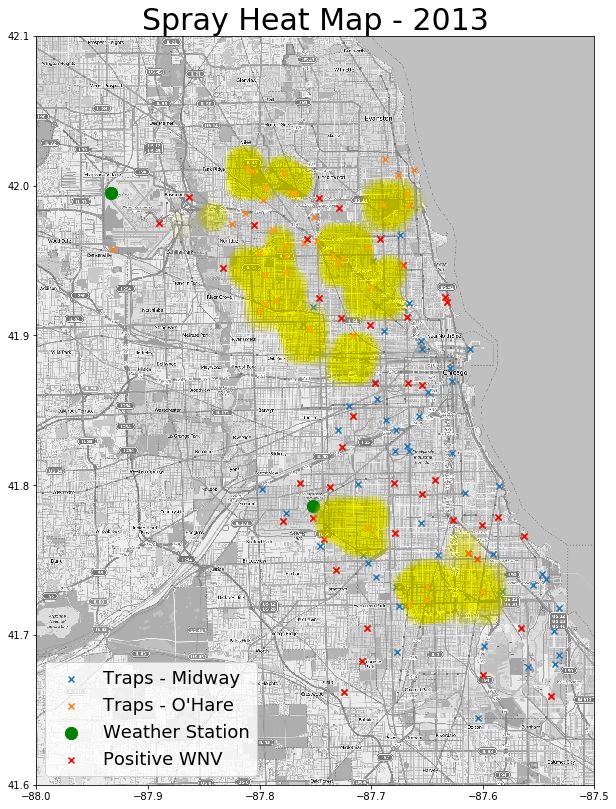

In [26]:

mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
spray_locations = spray_data[['Longitude', 'Latitude']][spray_data.Longitude > -88][spray_data.Date.str.contains("2013")].drop_duplicates().values
positives = traps[traps.WnvPresent==1][['Longitude', 'Latitude']][traps.Date.str.contains("2013")].drop_duplicates().values

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values
location1s = pd.concat([pd.DataFrame(location1), pd.DataFrame(positives)], axis=0).drop_duplicates().values
location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values
location2s = pd.concat([pd.DataFrame(location2), pd.DataFrame(positives)], axis=0).drop_duplicates().values
plt.scatter(location1s[:,0], location1s[:,1], marker='x')
plt.scatter(location2s[:,0], location2s[:,1], marker='x')
plt.scatter(long, lat, marker='o',c='g', s=150)
plt.scatter(positives[:,0], positives[:,1], marker='x', c='red')
plt.scatter(spray_locations[:,0], spray_locations[:,1], marker='o', c='yellow', alpha=0.01, s=600)

plt.title('Spray Heat Map - 2013', fontsize=30)

plt.legend(['Traps - Midway', "Traps - O'Hare", 'Weather Station', 'Positive WNV'], fontsize=18,loc=3)


plt.savefig('heatmap6.png')

## Dataframes creation prior to modeling


#### Train dataframe

In [27]:
train = pd.merge(train_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                 how='left') # merging the weather data to the train data based on the trap location

#### Test dataframe

In [28]:
test = pd.merge(test_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                how='left') # merging the weather data to the test data based on the trap location

## Modeling

#### First model training data

In [29]:
# replacing the species names with a classifier
train.Date = train.Date.map(lambda x: x[5:])
test.Date = test.Date.map(lambda x: x[5:])
species = dict(zip(test.Species.unique(), list(range(len(test.Species.unique())))))
traps = dict(zip(test.Trap.unique(), list(range(len(test.Trap.unique())))))
dates = dict(zip(np.unique(pd.concat([test.Date, train.Date], axis=0).values), 
                 list(range(len(np.unique(pd.concat([test.Date, train.Date], axis=0).values))))))
train.Species.replace(species, inplace=True)
train.Trap.replace(traps, inplace=True)
train.Date.replace(dates, inplace=True)

train.PrecipTotal = train.PrecipTotal.map(lambda x: 0.1 if x == '  T' else (0.01 if x =='M' else float(x)))
train.SeaLevel = train.SeaLevel.map(lambda x: float(x))

The features selected were determined to be the best while limiting the amount of correlation.

In [32]:
features = ['Date','Species','Trap', 'Tmax', 'DewPoint','PrecipTotal', 'SeaLevel']

X = train[features]
y = train.WnvPresent

## imports for models
from sklearn.grid_search import GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier, GradientBoostingClassifier

In [31]:
params = {'n_estimators':list(range(30, 100, 2)), 'max_depth':[2, 3, 4, 5, 6, 7, 8]}


xt = ExtraTreesClassifier(oob_score = True, bootstrap = True, n_jobs=-2)

xt_gs = GridSearchCV(xt, param_grid=params, verbose = 1, n_jobs = -2, cv = None)
xt_fit = xt_gs.fit(X, y)

print (xt_fit.best_score_)
print (xt_fit.best_estimator_)
print (xt_fit.best_params_)

Fitting 3 folds for each of 245 candidates, totalling 735 fits


[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:   25.3s


0.9475537787930707
ExtraTreesClassifier(bootstrap=True, class_weight=None, criterion='gini',
           max_depth=2, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=-2,
           oob_score=True, random_state=None, verbose=0, warm_start=False)
{'max_depth': 2, 'n_estimators': 30}


[Parallel(n_jobs=-2)]: Done 735 out of 735 | elapsed:   44.5s finished


#### First model - testing the test data to the model

In [33]:
# editing the Test data
test.Species.replace(species, inplace=True)
test.Trap.replace(traps, inplace=True)
test.Date.replace(dates, inplace=True)

test.PrecipTotal = test.PrecipTotal.map(lambda x: 0.1 if x == '  T' else (0.01 if x =='M' else float(x)))
test.SeaLevel = test.SeaLevel.map(lambda x: float(x))

In [34]:
X_test = test[features]

preds = xt_fit.predict_proba(X_test)

preds_up = [each[1] for each in preds]

df = pd.DataFrame({'Id': list(range(1,116294)),'WnvPresent': preds_up})
df.to_csv('./test_submission.csv', index=False)

params2 = {'n_estimators':list(range(30, 60, 2)), 'max_depth':[2, 3, 4, 5, 6, 7, 8]}
xt2 = ExtraTreesClassifier(oob_score = True, bootstrap = True, n_jobs=-2)

xt2_gs = GridSearchCV(xt2, param_grid=params2, verbose = 1, n_jobs = -2, cv = None)
xt2_fit = xt2_gs.fit(X2, y2)

print (xt2_fit.best_score_)
print (xt2_fit.best_estimator_)
print (xt2_fit.best_params_)

The model scored 0.64680% accuracy. Compared to the baseline accuracy of 50%, this is a good start and has room for improvement.



### Model 2 with new features

It was determined that a possible reason for a poor first model was due to the missing data in the first model. Therefore, the plan was to clean and edit the missing data before running the model again. The weather data could be edited easily as the missing data was usually only for one weather station or the other and rarely both weather stations failed to record for the day.

In [35]:
# fixing the '  T' data from the test set
df_weather.set_value(1987, 'PrecipTotal', 0.28); # updating the missing weather data - 2012-07-13
df_weather.set_value(1327, 'PrecipTotal', 0.03); # updating the missing weather data - 2010-08-20
df_weather.set_value(2001, 'PrecipTotal', 0.00); # updating the missing weather data - 2012-07-20
df_weather.set_value(1284, 'PrecipTotal', 0.30); # updating the missing weather data - 2010-07-30
df_weather.set_value(1285, 'PrecipTotal', 0.30); # updating the missing weather data - 2010-07-30
df_weather.set_value(2041, 'PrecipTotal', 0.05); # updating the missing weather data - 2012-08-09
df_weather.set_value(1263, 'PrecipTotal', 0.01); # updating the missing weather data - 2010-07-19
df_weather.set_value(2140, 'PrecipTotal', 0.00); # updating the missing weather data - 2012-09-28
df_weather.set_value(1248, 'PrecipTotal', 0.01); # updating the missing weather data - 2010-07-12
df_weather.set_value(2660, 'PrecipTotal', 0.01); # updating the missing weather data - 2014-06-12
df_weather.set_value(642, 'PrecipTotal', 0.01); # updating the missing weather data - 2008-09-15
df_weather.set_value(617, 'PrecipTotal', 0.00); # updating the missing weather data - 2008-09-02
df_weather.set_value(2814, 'PrecipTotal', 0.02); # updating the missing weather data - 2014-08-28
df_weather.set_value(577, 'PrecipTotal', 0.06); # updating the missing weather data - 2008-08-13

#fixing the 'M' and '  T' data from the PrecipTotal
df_weather.set_value(119, 'PrecipTotal', 0.00); # updating the missing weather data - 2007-06-29
df_weather.set_value(1592, 'PrecipTotal', 0.03); # updating the missing weather data - 2011-06-30
df_weather.set_value(891, 'PrecipTotal', 0.00); # updating the missing weather data - 2009-07-17
df_weather.set_value(1622, 'PrecipTotal', 0.00); # updating the missing weather data - 2011-07-15
df_weather.set_value(1664, 'PrecipTotal', 0.09); # updating the missing weather data - 2011-08-05
df_weather.set_value(1665, 'PrecipTotal', 0.34); # updating the missing weather data - 2011-08-05
df_weather.set_value(821, 'PrecipTotal', 0.73); # updating the missing weather data - 2009-06-12- avg days before/after
df_weather.set_value(820, 'PrecipTotal', 0.73); # updating the missing weather data - 2009-06-12- avg days before/after
df_weather.set_value(1721, 'PrecipTotal', 0.00); # updating the missing weather data - 2011-09-02
df_weather.set_value(2282, 'PrecipTotal', 0.00); # updating the missing weather data - 2013-06-07
df_weather.set_value(2324, 'PrecipTotal', 0.16); # updating the missing weather data - 2013-06-28
df_weather.set_value(2367, 'PrecipTotal', 0.58); # updating the missing weather data - 2013-07-19
df_weather.set_value(254, 'PrecipTotal', 0.00); # updating the missing weather data - 2007-09-05
df_weather.set_value(2366, 'PrecipTotal', 0.58); # updating the missing weather data - 2013-07-19
df_weather.set_value(224, 'PrecipTotal', 0.01); # updating the missing weather data - 2007-08-21
df_weather.set_value(2476, 'PrecipTotal', 0.06); # updating the missing weather data - 2013-09-12
df_weather.set_value(170, 'PrecipTotal', 0.00); # updating the missing weather data - 2007-07-25
df_weather.set_value(2491, 'PrecipTotal', 0.84); # updating the missing weather data - 2013-09-19
df_weather.set_value(113, 'PrecipTotal', 0.16); # updating the missing weather data - 2007-06-26

In [36]:
train2 = pd.merge(train_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                 how='left') # merging the weather data to the train data based on the trap location


test2 = pd.merge(test_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                how='left') # merging the weather data to the test data based on the trap location


train2.Date = train2.Date.map(lambda x: x[5:])
test2.Date = test2.Date.map(lambda x: x[5:])
dates2 = dict(zip(np.unique(pd.concat([test2.Date, train2.Date], axis=0).values), 
                 list(range(len(np.unique(pd.concat([test2.Date, train2.Date], axis=0).values))))))
train2.Date.replace(dates2, inplace=True)
test2.Date.replace(dates2, inplace=True)
train2.Species.replace(species, inplace=True)
test2.Species.replace(species, inplace=True)

In [37]:
features2 = ['Date','Species','Longitude', 'Latitude', 'Tmax', 'DewPoint','PrecipTotal']

X2 = train2[features2]
y2= train2.WnvPresent

In [38]:
params2 = {'n_estimators':list(range(30, 60, 2)), 'max_depth':[2, 3, 4, 5, 6, 7, 8]}
xt2 = ExtraTreesClassifier(oob_score = True, bootstrap = True, n_jobs=-2)

xt2_gs = GridSearchCV(xt2, param_grid=params2, verbose = 1, n_jobs = -2, cv = None)
xt2_fit = xt2_gs.fit(X2, y2)

print (xt2_fit.best_score_)
print (xt2_fit.best_estimator_)
print (xt2_fit.best_params_)

Fitting 3 folds for each of 105 candidates, totalling 315 fits


[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    8.6s


0.9475537787930707
ExtraTreesClassifier(bootstrap=True, class_weight=None, criterion='gini',
           max_depth=2, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=-2,
           oob_score=True, random_state=None, verbose=0, warm_start=False)
{'max_depth': 2, 'n_estimators': 30}


[Parallel(n_jobs=-2)]: Done 315 out of 315 | elapsed:   14.6s finished


In [40]:
X_test2 = test2[features2]

preds2 = xt2_gs.predict_proba(X_test2)

preds2_up = [each[1] for each in preds2]

df2 = pd.DataFrame({'Id': list(range(1,116294)),'WnvPresent': preds2_up})
df2.to_csv('./test_submission_preds2.csv', index=False)

The second model performed much better as it returned a 0.70537% accuracy. In the end this was determined to be our best model with the limited amount of data provided

In [41]:
an = xt2_fit.best_estimator_.predict_proba(X_test2)
preds2s_up = [each[1] for each in an]

tests_df = test_df.copy()
tests_df['Proba'] = preds2s_up

In [42]:
results = tests_df[tests_df.Proba > 0.07].sort_values('Proba', ascending=False)
top_traps = ['T903', 'T900', 'T015', 'T011', 'T009', 'T037', 'T143', 'T006',
             'T016', 'T233', 'T002B', 'T002A', 'T223', 'T144', 'T014', 'T013',
             'T002', 'T151', 'T070', 'T142', 'T008', 'T005', 'T017']
results[results.Trap.isin(top_traps)];

In [43]:
results_species = ['CULEX PIPIENS', 'CULEX PIPIENS/RESTUANS', 'CULEX RESTUANS', 'CULEX SALINARIUS']
results_species_count = [129, 42, 36, 23]

In [44]:
percent = []
for each in results_species_count:
    percent.append((each/sum(results_species_count))*100)
percent

[56.086956521739125, 18.26086956521739, 15.65217391304348, 10.0]

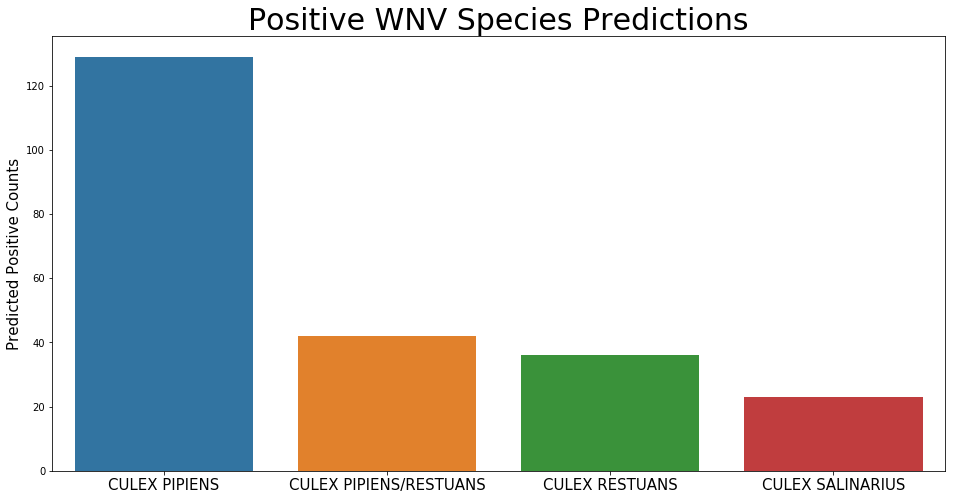

In [45]:
plt.figure(figsize=(16,8))
bplot = sns.barplot(results_species, results_species_count)
#bplot.set.xticklabels(rotation=30)
plt.xticks(rotation=0, fontsize=15)
plt.ylabel('Predicted Positive Counts', fontsize=15)
plt.title('Positive WNV Species Predictions',fontsize=30)
plt.savefig('positve_WNV_Species.png')

The bar graph above is representing the count of positive WNV for the top 20 trap sites according to model. The counts are an idicaiton that there will be at least one positive mosquito for the times checked.

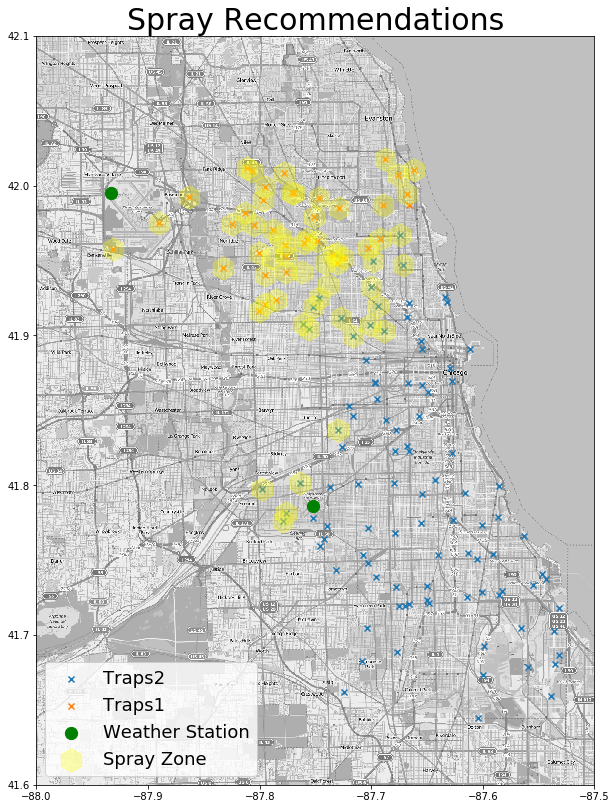

In [46]:

mapdata = np.loadtxt("../input/mapdata_copyright_openstreetmap_contributors.txt")
traps = pd.read_csv('../input/train.csv')[['Date', 'Trap','Longitude', 'Latitude', 'WnvPresent']]

aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)
#weather stations
#Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
#Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level
lat = [41.995, 41.786]
long = [-87.933, -87.752]
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
spray_locations = results[['Longitude', 'Latitude']].drop_duplicates().values

location1 = locations_df[locations_df.Station == 1][['Longitude', 'Latitude']].drop_duplicates().values

location2 = locations_df[locations_df.Station == 2][['Longitude', 'Latitude']].drop_duplicates().values

plt.scatter(location1[:,0], location1[:,1], marker='x')
plt.scatter(location2[:,0], location2[:,1], marker='x')
plt.scatter(long, lat, marker='o',c='g', s=150)
plt.scatter(spray_locations[:,0], spray_locations[:,1], marker='h', c='yellow', alpha=0.3, s=550)
plt.title('Spray Recommendations', fontsize=30)
plt.legend(['Traps2', 'Traps1', 'Weather Station', 'Spray Zone'], fontsize=18,loc=3)


# Add this when copying to a script on Kaggle:
plt.savefig('heatmap7.png')

### Creating a Model with spray data incorporated - Model 3
The goal here was to try and incorporate the spray data to fit the model. As the spray data was only provided for years 2011 and 2013, the model did not perform as well as model 2.

It seemed that adding the spray data only confused the model more and made the predictions not as accurate.

In [47]:
def truncate(x):
    return float('%.2f' % x)

In [48]:
Trap_loc_df = pd.DataFrame(test_df[['Trap', 'Longitude', 'Latitude']].drop_duplicates().values, columns=['Trap', 'Longitude', 'Latitude'])

test_dfs = test_df.copy()

train_dfs = train_df.copy()

spray_datas = spray_data.copy()

spray_datas['Latitude'] = spray_datas.Latitude.map(lambda x: truncate(x))
spray_datas['Longitude'] = spray_datas.Longitude.map(lambda x: truncate(x))
test_dfs['Latitude'] = test_dfs.Latitude.map(lambda x: truncate(x))
test_dfs['Longitude'] = test_dfs.Longitude.map(lambda x: truncate(x))
train_dfs['Latitude'] = train_dfs.Latitude.map(lambda x: truncate(x))
train_dfs['Longitude'] = train_dfs.Longitude.map(lambda x: truncate(x))

In [49]:
spray_trap_merged = pd.merge(train_dfs,spray_datas[['Date', 'Latitude', 'Longitude', 'Time']], how='left')

spray_trap_merged.Time = spray_trap_merged.Time.map(lambda x: 0 if pd.isnull(x) else 1 )

spray_trap_merged_test = pd.merge(test_dfs, spray_datas[['Date', 'Latitude', 'Longitude', 'Time']], how='left')
spray_trap_merged_test.Time = spray_trap_merged_test.Time.map(lambda x: 0 if pd.isnull(x) else 1 )

train3 = pd.merge(spray_trap_merged, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                 how='left') # merging the weather data to the train data based on the trap location
test3 = pd.merge(spray_trap_merged_test, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                how='left') # merging the weather data to the test data based on the trap location
train3.Date = train3.Date.map(lambda x: x[5:])
test3.Date = test3.Date.map(lambda x: x[5:])
dates3 = dict(zip(np.unique(pd.concat([test3.Date, train3.Date], axis=0).values), 
                 list(range(len(np.unique(pd.concat([test3.Date, train3.Date], axis=0).values))))))

test = pd.merge(test_df, df_weather[['Station','Date','Tmax','Tavg','DewPoint','PrecipTotal', 'SeaLevel']], 
                how='left') # merging the weather data to the test data based on the trap location
species = dict(zip(test.Species.unique(), list(range(len(test.Species.unique())))))

train3.Date.replace(dates3, inplace=True)
test3.Date.replace(dates3, inplace=True)
train3.Species.replace(species, inplace=True)
test3.Species.replace(species, inplace=True)

In [50]:
features3 = ['Date','Species','Longitude', 'Latitude', 'Tmax', 'DewPoint','PrecipTotal']
X3 = train3[features3]
y3= train3.WnvPresent

params3 = {'n_estimators':list(range(30, 60, 2)), 'max_depth':[2, 3, 4, 5, 6, 7, 8]}
xt3 = ExtraTreesClassifier(oob_score = True, bootstrap = True, n_jobs=-2)

xt3_gs = GridSearchCV(xt3, param_grid=params3, verbose = 1, n_jobs = -2, cv = None)
xt3_fit = xt3_gs.fit(X3, y3)

print (xt3_fit.best_score_)
print (xt3_fit.best_estimator_)
print (xt3_fit.best_params_)

Fitting 3 folds for each of 105 candidates, totalling 315 fits


[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-2)]: Done 315 out of 315 | elapsed:   16.0s finished


0.9177938808373591
ExtraTreesClassifier(bootstrap=True, class_weight=None, criterion='gini',
           max_depth=2, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=30, n_jobs=-2,
           oob_score=True, random_state=None, verbose=0, warm_start=False)
{'max_depth': 2, 'n_estimators': 30}


In [51]:
X_test3 = test3[features3]

preds3 = xt3_gs.best_estimator_.predict_proba(X_test3)

preds3_up = [each[1] for each in preds3]

df3 = pd.DataFrame({'Id': list(range(1,116294)),'WnvPresent': preds3_up})
df3.to_csv('./test_submission_preds3.csv', index=False)